In [5]:
%load_ext autoreload
%autoreload 2
import numpy as np
from glob import glob
import matplotlib.pyplot as plt
import os
import tifffile as tiff
import openlm.tools.stitching as st
from pprint import pprint
from openlm.structures import StitchingParameters
from openlm.tools import flat_field_correction as ffc

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
lm_paths = glob(r"C:\Users\User\Documents\15-06-23 - Cells - LM\15-06-23 - Cells - LM\*\max.tif")
# sort lm paths into lists by dirname
lm_paths_by_dirname = {}

for path in lm_paths:
    dirname = os.path.dirname(path)
    if dirname not in lm_paths_by_dirname:
        lm_paths_by_dirname[dirname] = []
    lm_paths_by_dirname[dirname].append(os.path.basename(path))

In [3]:
# group the paths into groups of 3
count = 0
grouped_paths = {}
for folder in lm_paths_by_dirname.keys():
    if count % 3 == 0:
        current_folder = count
        grouped_paths[current_folder ] = []
    grouped_paths[current_folder].append(folder)
    count += 1

from pprint import pprint
pprint(grouped_paths)

{0: ['C:\\Users\\User\\Documents\\15-06-23 - Cells - LM\\15-06-23 - Cells - '
     'LM\\workflow_2023-06-15-03-21-43-604525PM',
     'C:\\Users\\User\\Documents\\15-06-23 - Cells - LM\\15-06-23 - Cells - '
     'LM\\workflow_2023-06-15-03-25-02-080657PM',
     'C:\\Users\\User\\Documents\\15-06-23 - Cells - LM\\15-06-23 - Cells - '
     'LM\\workflow_2023-06-15-03-28-19-688332PM'],
 3: ['C:\\Users\\User\\Documents\\15-06-23 - Cells - LM\\15-06-23 - Cells - '
     'LM\\workflow_2023-06-15-03-30-05-428287PM',
     'C:\\Users\\User\\Documents\\15-06-23 - Cells - LM\\15-06-23 - Cells - '
     'LM\\workflow_2023-06-15-03-31-51-272051PM',
     'C:\\Users\\User\\Documents\\15-06-23 - Cells - LM\\15-06-23 - Cells - '
     'LM\\workflow_2023-06-15-03-33-16-836224PM'],
 6: ['C:\\Users\\User\\Documents\\15-06-23 - Cells - LM\\15-06-23 - Cells - '
     'LM\\workflow_2023-06-15-03-35-25-496261PM',
     'C:\\Users\\User\\Documents\\15-06-23 - Cells - LM\\15-06-23 - Cells - '
     'LM\\workflow_2023-

(68, 47)


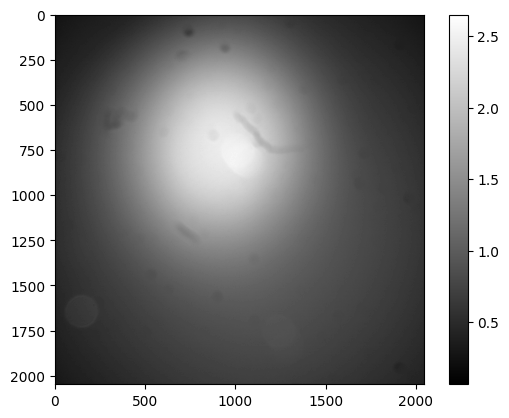

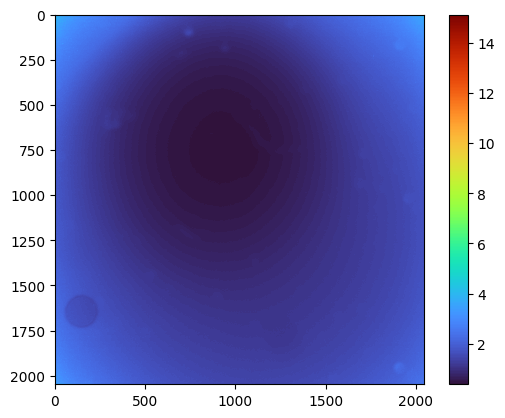

In [21]:
flat_field = ffc.FLATFIELDNORMALISED
# find location of max pixel in flat field
flat_field_max = np.unravel_index(np.argmin(flat_field), flat_field.shape)
print(flat_field_max)
# set flat_field_max to average
flat_field[flat_field_max] = np.mean(flat_field)
plt.imshow(flat_field, cmap='gray')
plt.colorbar()
plt.figure()
plt.imshow(1/flat_field, cmap='turbo')
plt.colorbar()


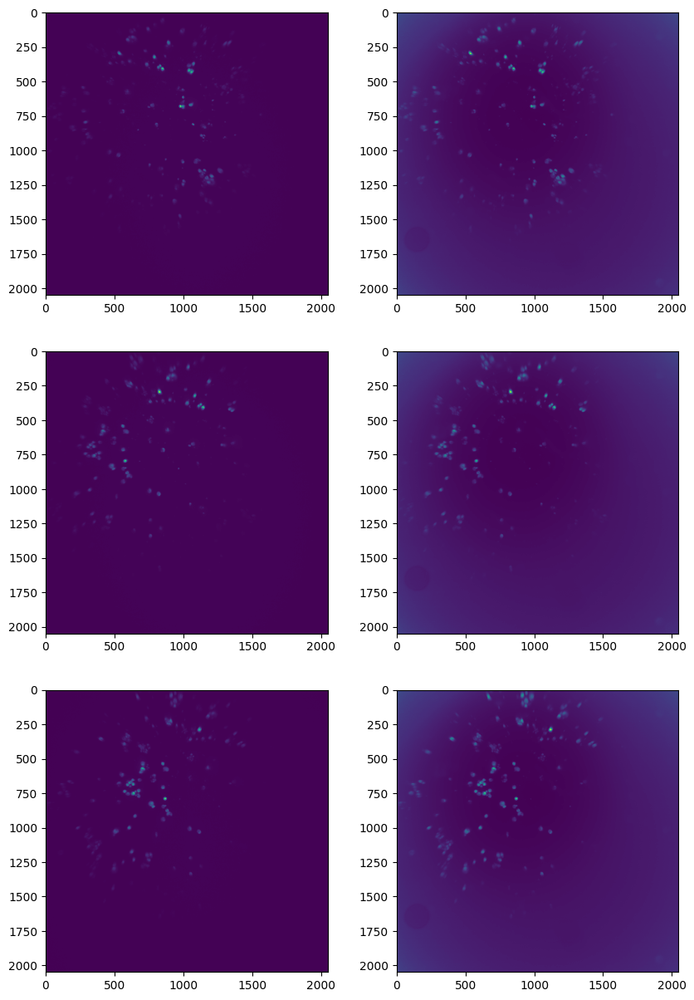

In [35]:
stiching_parameters = StitchingParameters.__from_dict__({
    "folder_path": r"C:\Users\User\Documents\15-06-23 - Cells - LM\15-06-23 - Cells - LM",
    "n_rows": 1,
    "n_cols": 3,
    "debug": True,
})
image_1 = tiff.imread(os.path.join(grouped_paths[0][-1], 'max.tif'))
image_2 = tiff.imread(os.path.join(grouped_paths[0][-2], 'max.tif'))
image_3 = tiff.imread(os.path.join(grouped_paths[0][-3], 'max.tif'))

ax, fig = plt.subplots(3, 2, figsize=(10, 15))
fig[0, 0].imshow(image_1)
fig[0, 1].imshow(ffc.corrected_image(image_1, ffc.DARKFIELD, ffc.FLATFIELDNORMALISED))
fig[1, 0].imshow(image_2)
fig[1, 1].imshow(ffc.corrected_image(image_2, ffc.DARKFIELD, ffc.FLATFIELDNORMALISED))
fig[2, 0].imshow(image_3)
fig[2, 1].imshow(ffc.corrected_image(image_3, ffc.DARKFIELD, ffc.FLATFIELDNORMALISED))



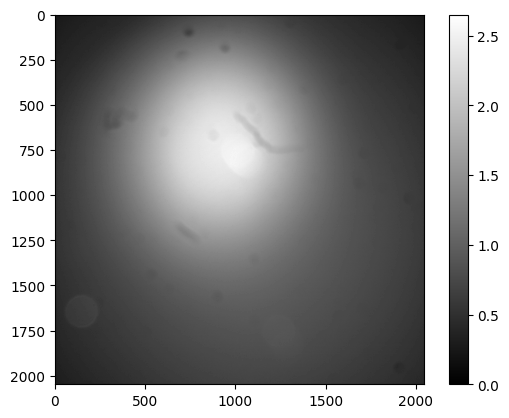

In [8]:
plt.imshow(ffc.FLATFIELDNORMALISED, cmap='gray')
plt.colorbar()

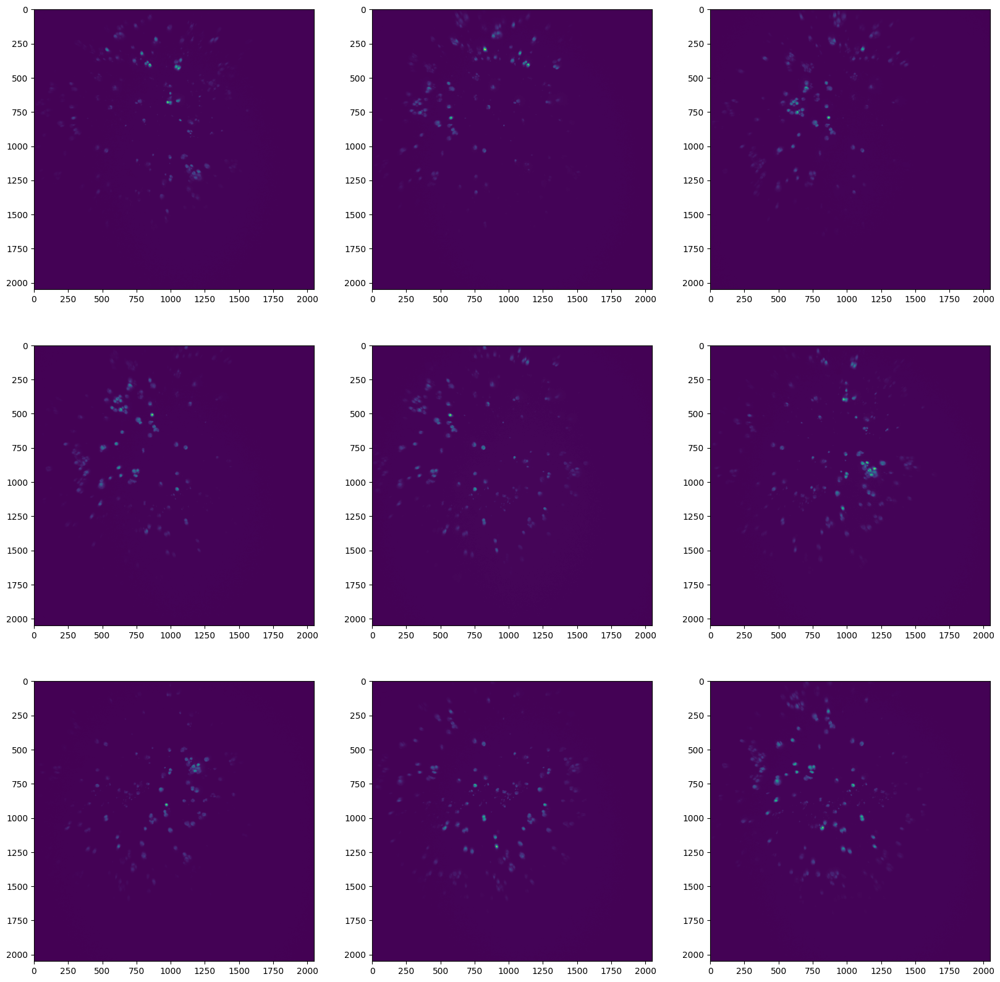

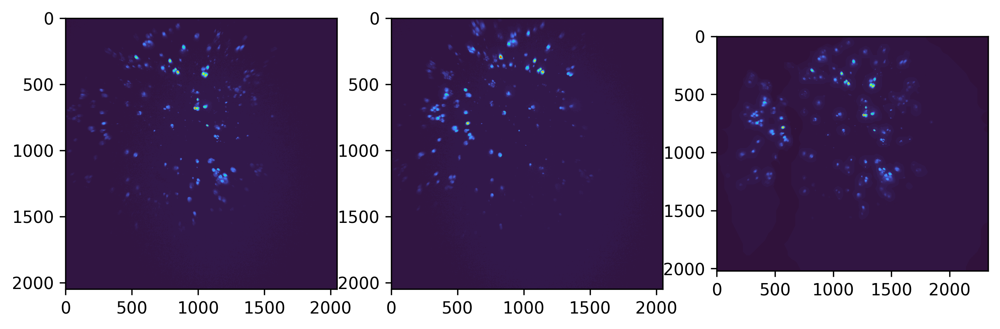

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


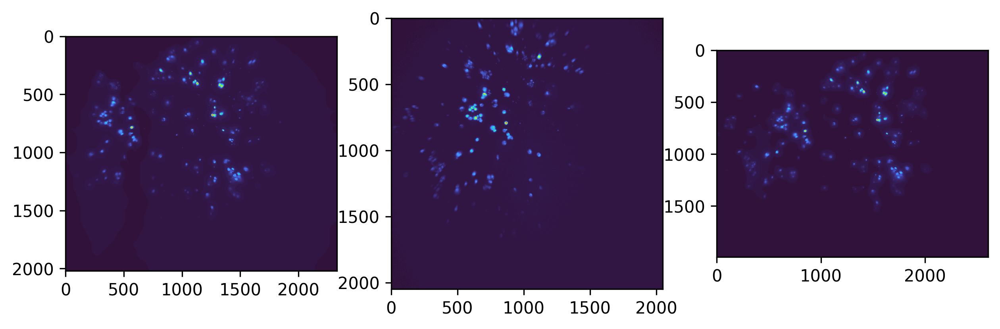

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


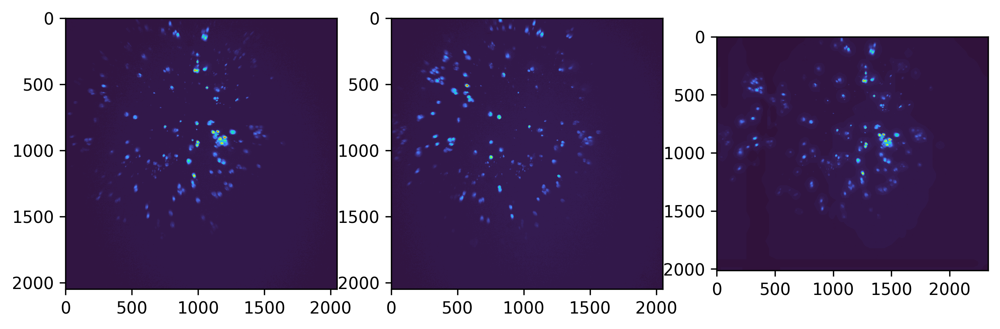

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


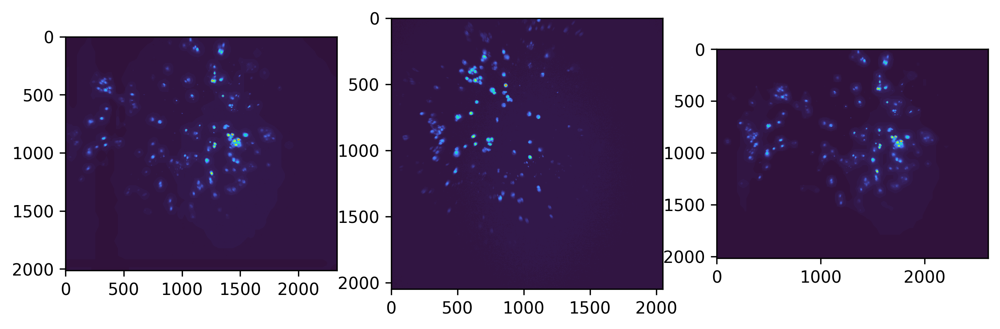

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


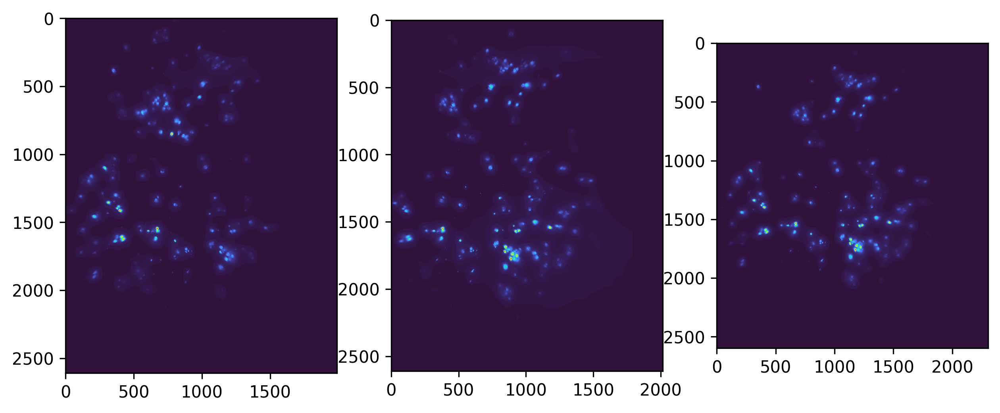

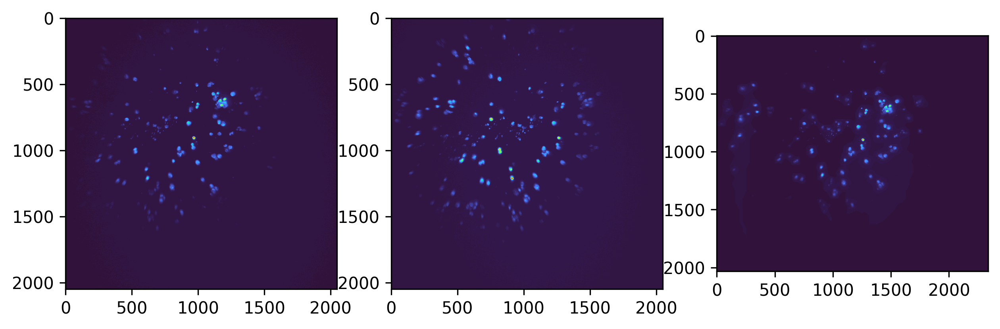

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


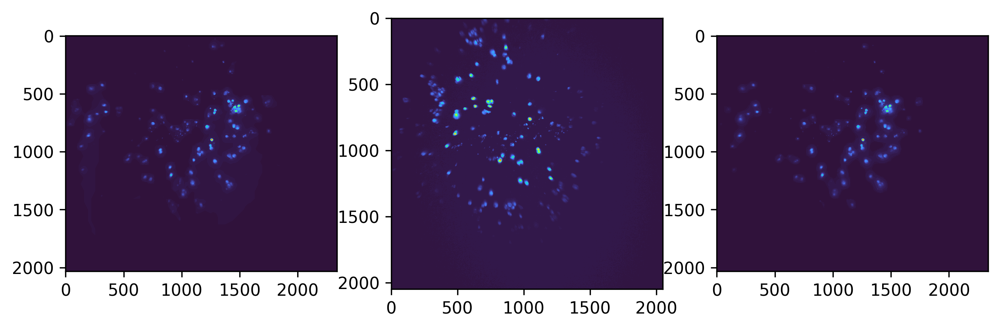

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


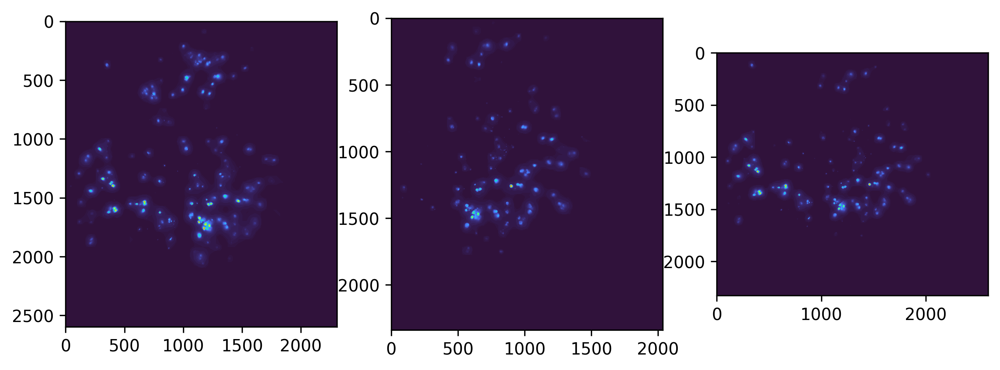

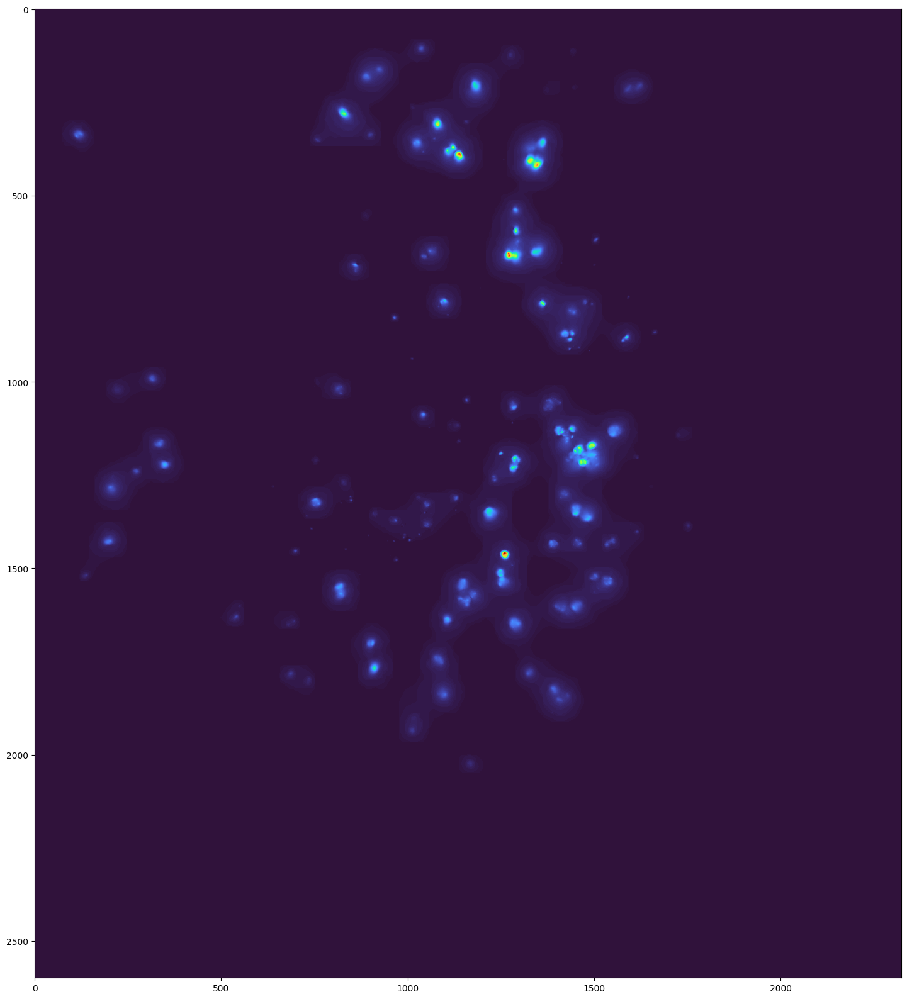

In [36]:
ax, fig = plt.subplots(3, 3, figsize=(20, 20))

image_1 = tiff.imread(os.path.join(grouped_paths[0][-1], 'max.tif'))
image_2 = tiff.imread(os.path.join(grouped_paths[0][-2], 'max.tif'))
image_3 = tiff.imread(os.path.join(grouped_paths[0][-3], 'max.tif'))

fig[0, 0].imshow(image_1)
fig[0, 1].imshow(image_2)
fig[0, 2].imshow(image_3)

images = [image_1, image_2, image_3]

image_1_2 = tiff.imread(os.path.join(grouped_paths[3][-3], 'max.tif'))
image_2_2 = tiff.imread(os.path.join(grouped_paths[3][-2], 'max.tif'))
image_3_2 = tiff.imread(os.path.join(grouped_paths[3][-1], 'max.tif'))

fig[1, 0].imshow(image_3_2)
fig[1, 1].imshow(image_2_2)
fig[1, 2].imshow(image_1_2)

images2 = [image_1_2, image_2_2, image_3_2]

image_1_3 = tiff.imread(os.path.join(grouped_paths[6][-1], 'max.tif'))
image_2_3 = tiff.imread(os.path.join(grouped_paths[6][-2], 'max.tif'))
image_3_3 = tiff.imread(os.path.join(grouped_paths[6][-3], 'max.tif'))

fig[2, 0].imshow(image_1_3)
fig[2, 1].imshow(image_2_3)
fig[2, 2].imshow(image_3_3)

images3 = [image_1_3, image_2_3, image_3_3]

images_total = [images, images2, images3]

plt.show()

result = st.stitch_tile(images_total, stiching_parameters, dpi=300, cmap='turbo', figsize=(10, 10))
plt.figure(figsize=(20, 20))
plt.imshow(result, cmap='turbo')
plt.show()

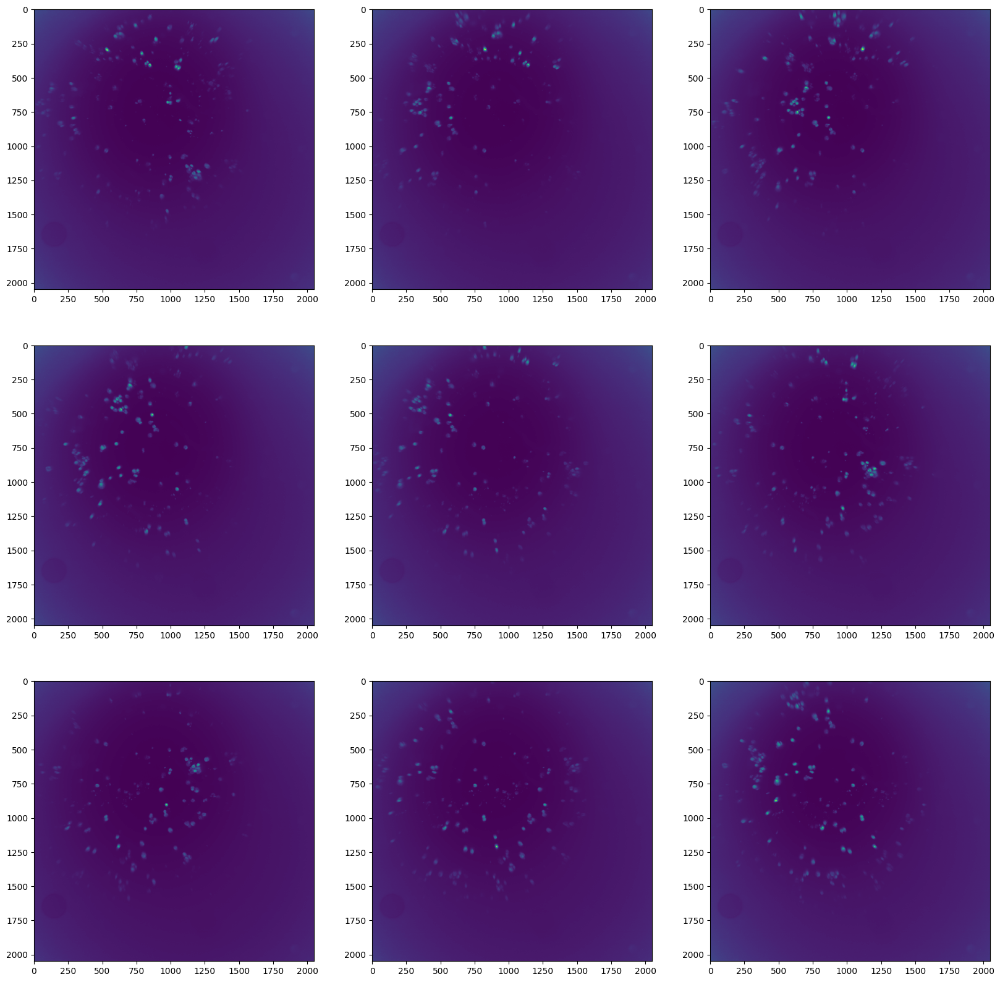

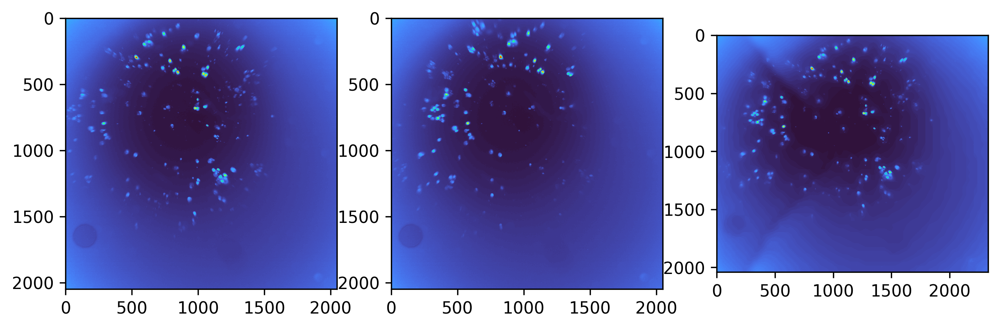

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


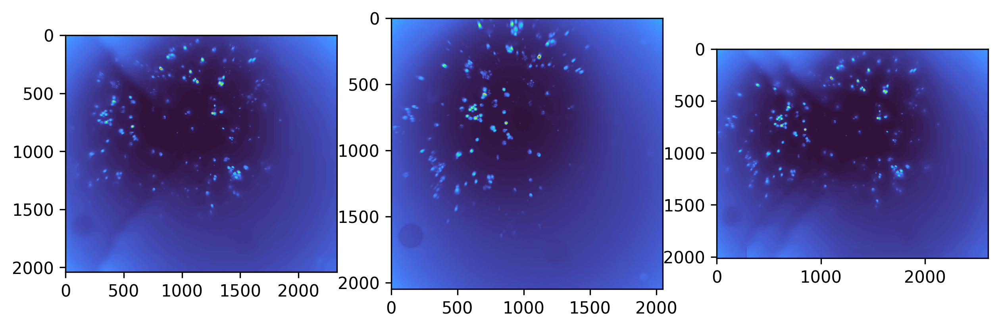

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


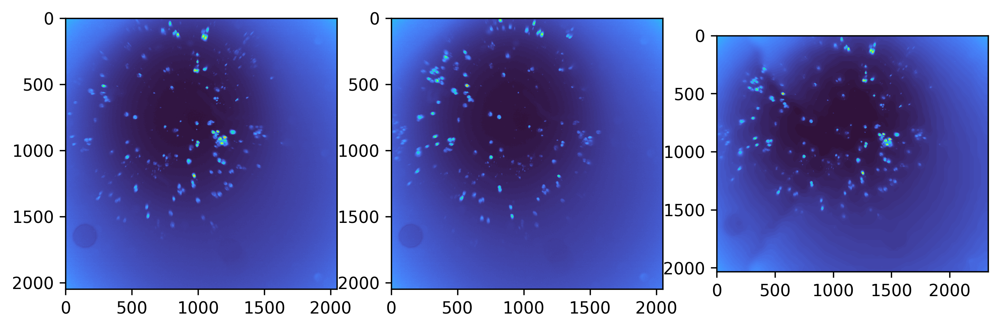

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


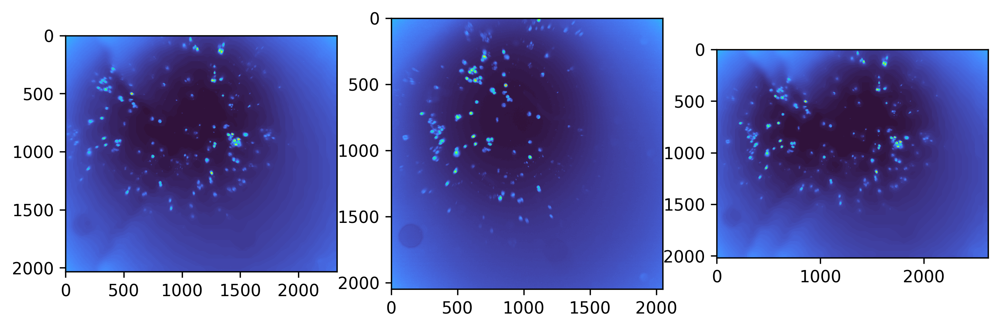

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


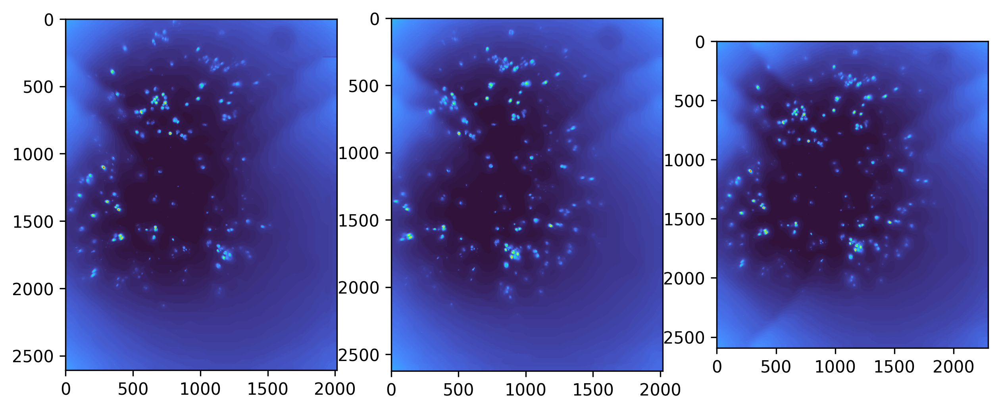

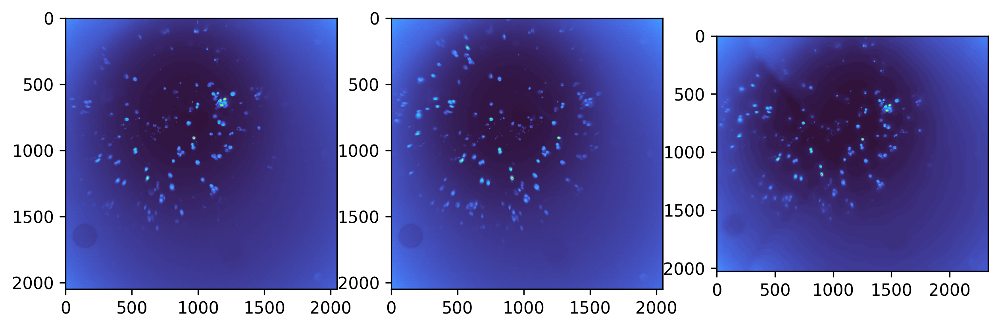

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


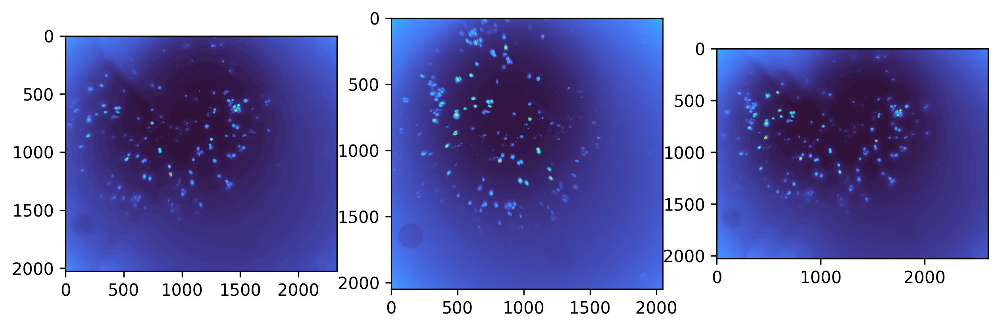

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


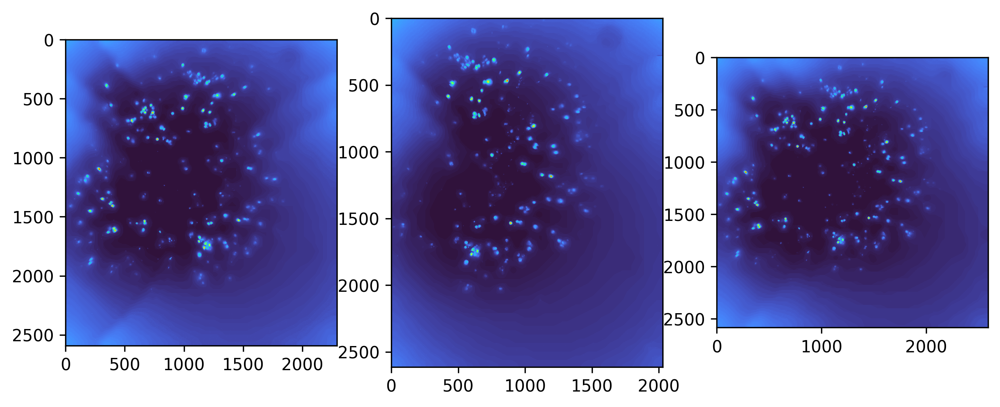

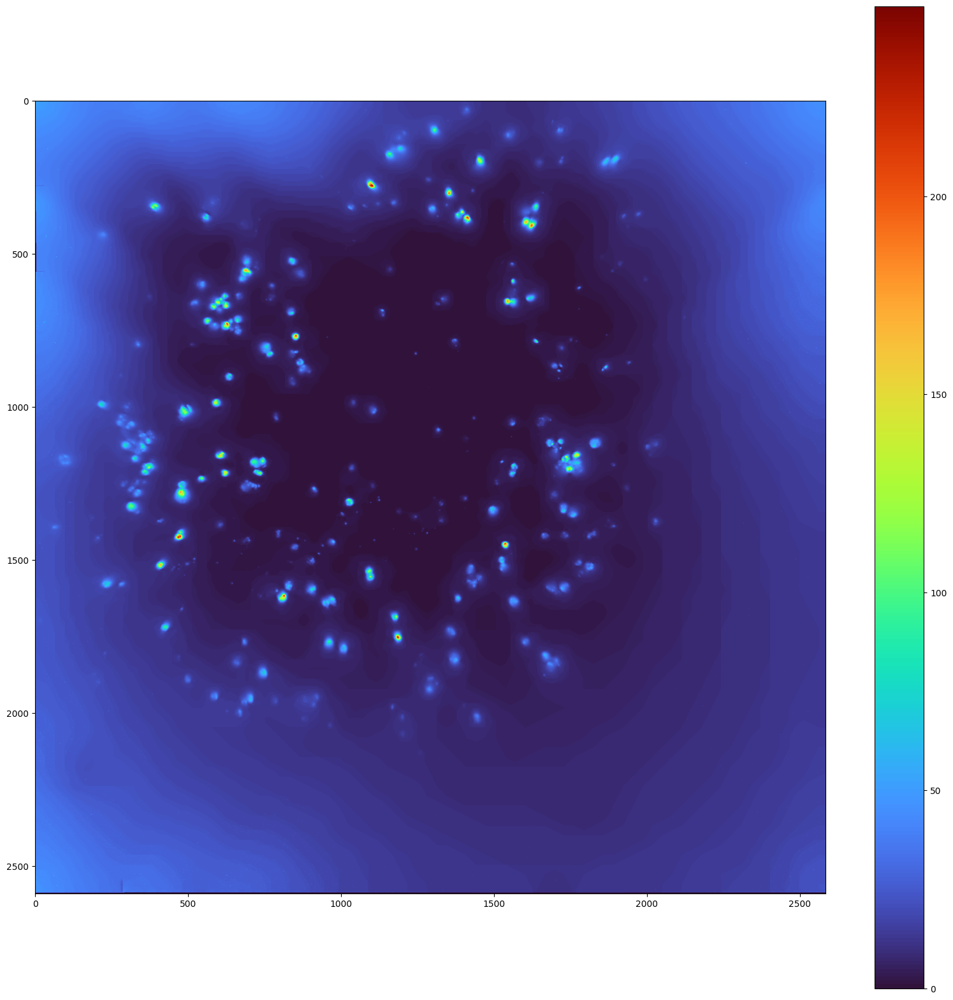

In [39]:
ax, fig = plt.subplots(3, 3, figsize=(20, 20))

image_1 = tiff.imread(os.path.join(grouped_paths[0][-1], 'max.tif'))
image_1 = ffc.corrected_image(image_1, ffc.DARKFIELD, ffc.FLATFIELDNORMALISED)
image_2 = tiff.imread(os.path.join(grouped_paths[0][-2], 'max.tif'))
image_2 = ffc.corrected_image(image_2, ffc.DARKFIELD, ffc.FLATFIELDNORMALISED)
image_3 = tiff.imread(os.path.join(grouped_paths[0][-3], 'max.tif'))
image_3 = ffc.corrected_image(image_3, ffc.DARKFIELD, ffc.FLATFIELDNORMALISED)

fig[0, 0].imshow(image_1)
fig[0, 1].imshow(image_2)
fig[0, 2].imshow(image_3)

images = [image_1, image_2, image_3]

image_1_2 = tiff.imread(os.path.join(grouped_paths[3][-3], 'max.tif'))
image_1_2 = ffc.corrected_image(image_1_2, ffc.DARKFIELD, ffc.FLATFIELDNORMALISED)
image_2_2 = tiff.imread(os.path.join(grouped_paths[3][-2], 'max.tif'))
image_2_2 = ffc.corrected_image(image_2_2, ffc.DARKFIELD, ffc.FLATFIELDNORMALISED)
image_3_2 = tiff.imread(os.path.join(grouped_paths[3][-1], 'max.tif'))
image_3_2 = ffc.corrected_image(image_3_2, ffc.DARKFIELD, ffc.FLATFIELDNORMALISED)

fig[1, 0].imshow(image_3_2)
fig[1, 1].imshow(image_2_2)
fig[1, 2].imshow(image_1_2)

images2 = [image_1_2, image_2_2, image_3_2]

image_1_3 = tiff.imread(os.path.join(grouped_paths[6][-1], 'max.tif'))
image_1_3 = ffc.corrected_image(image_1_3, ffc.DARKFIELD, ffc.FLATFIELDNORMALISED)
image_2_3 = tiff.imread(os.path.join(grouped_paths[6][-2], 'max.tif'))
image_2_3 = ffc.corrected_image(image_2_3, ffc.DARKFIELD, ffc.FLATFIELDNORMALISED)
image_3_3 = tiff.imread(os.path.join(grouped_paths[6][-3], 'max.tif'))
image_3_3 = ffc.corrected_image(image_3_3, ffc.DARKFIELD, ffc.FLATFIELDNORMALISED)

fig[2, 0].imshow(image_1_3)
fig[2, 1].imshow(image_2_3)
fig[2, 2].imshow(image_3_3)

images3 = [image_1_3, image_2_3, image_3_3]

images_total = [images, images2, images3]

plt.show()

result = st.stitch_tile(images_total, stiching_parameters, dpi=300, cmap='turbo', figsize=(10, 10))
plt.figure(figsize=(20, 20))
plt.imshow(result, cmap='turbo')
plt.colorbar()
plt.show()

In [40]:
# save result array
tiff.imsave(os.path.join(r'C:\Users\User\Github\openCLEM\scratch', 'stitched.tif'), result)

C:\Users\User\AppData\Local\Temp\ipykernel_4848\2642315050.py:2: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(os.path.join(r'C:\Users\User\Github\openCLEM\scratch', 'stitched.tif'), result)


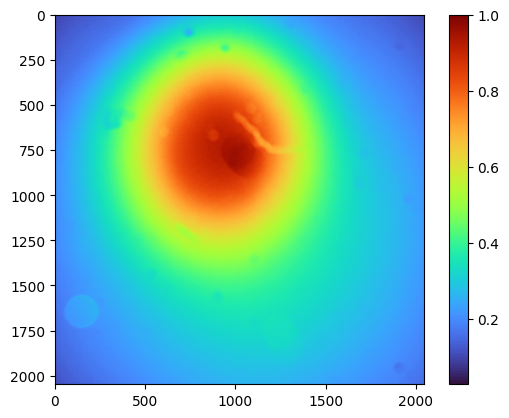

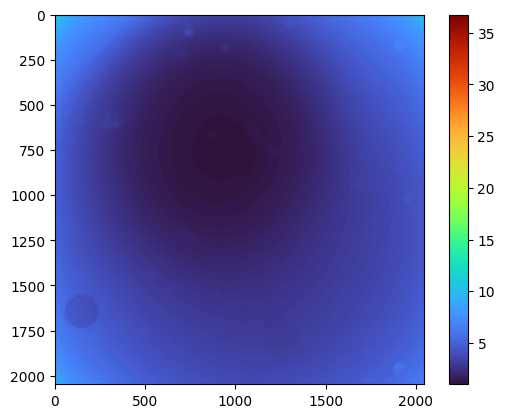

(233, 78)


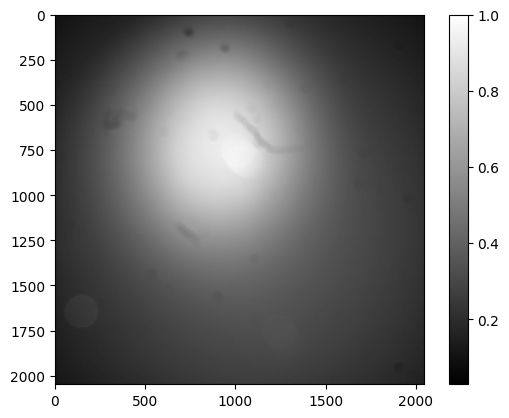

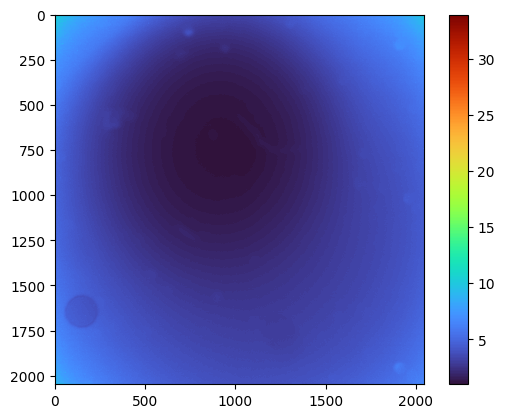

In [38]:

flat_field_ = ffc.FLATFIELDARRAY

plt.imshow(flat_field_, cmap='turbo')
plt.colorbar()
plt.figure()
plt.imshow(1/flat_field_, cmap='turbo')
plt.colorbar()
plt.show()
# find location of max pixel in flat field
flat_field_min = np.unravel_index(np.argmin(flat_field_), flat_field_.shape)
print(flat_field_min)
# set flat_field_max to average
flat_field_[flat_field_min] = np.mean(flat_field_)
plt.imshow(flat_field_, cmap='gray')
plt.colorbar()
plt.figure()
plt.imshow(1/flat_field_, cmap='turbo')
plt.colorbar()


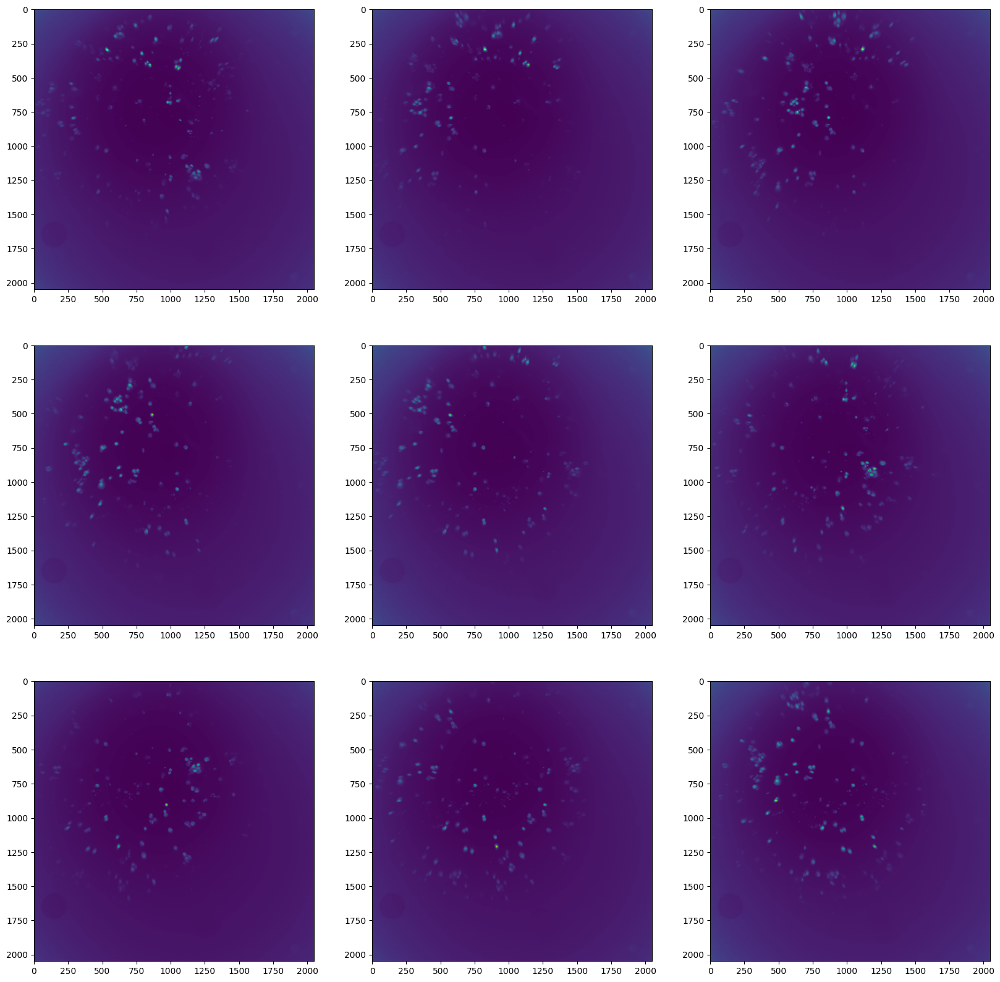

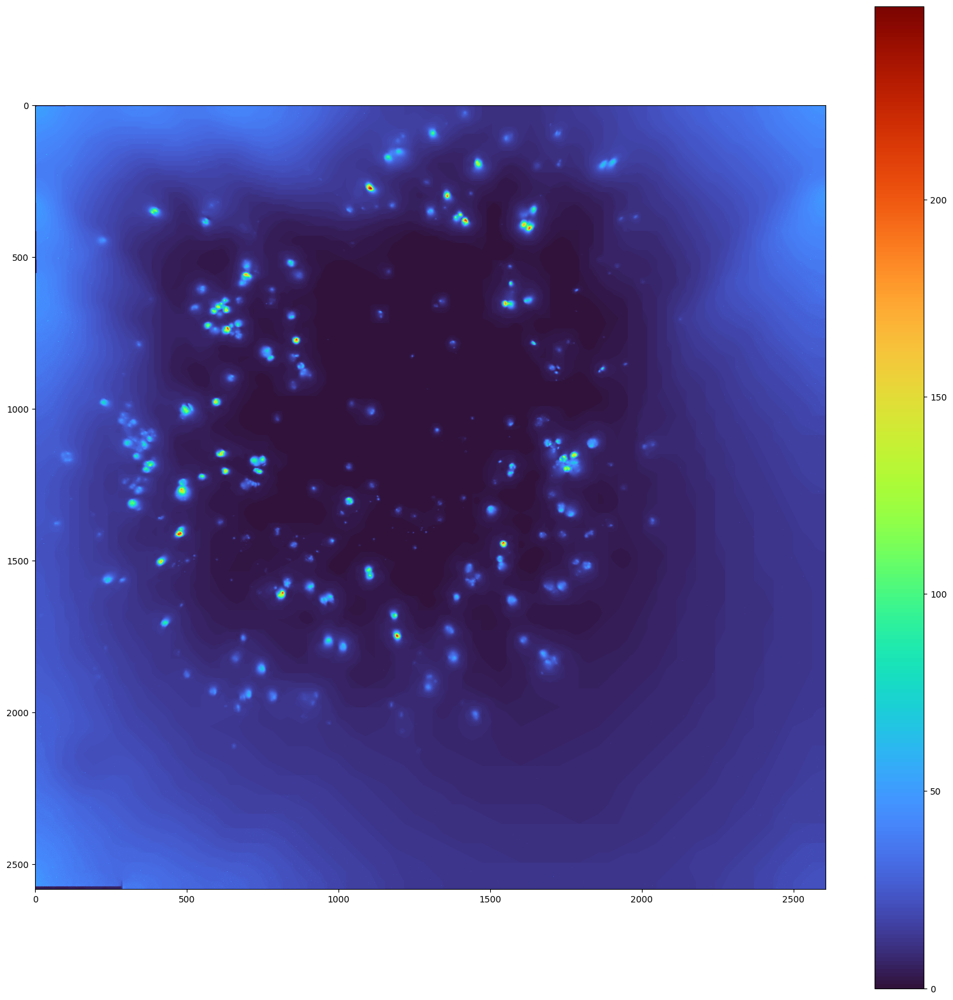

TypeError: Invalid shape (28910,) for image data

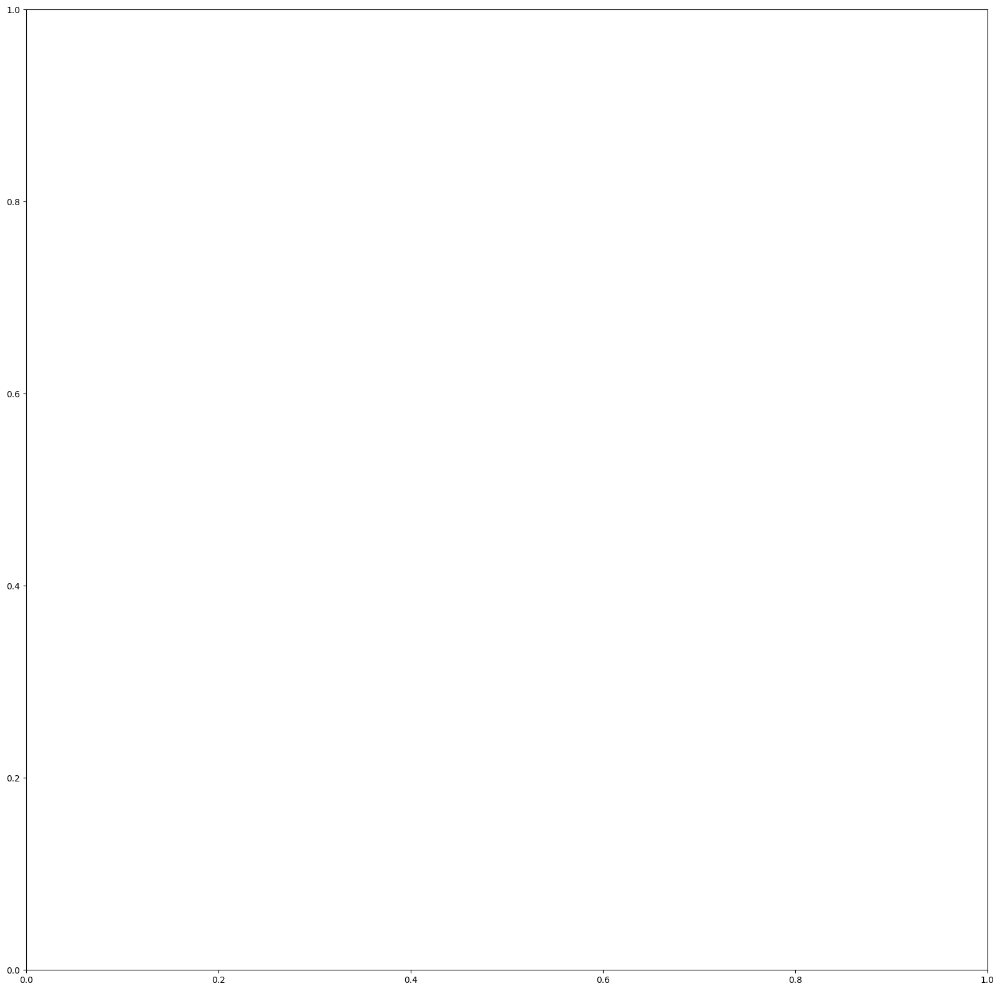

In [34]:

ax, fig = plt.subplots(3, 3, figsize=(20, 20))

image_1 = tiff.imread(os.path.join(grouped_paths[0][-1], 'max.tif'))
image_1 = ffc.corrected_image(image_1, ffc.DARKFIELD, ffc.FLATFIELDARRAY)
image_2 = tiff.imread(os.path.join(grouped_paths[0][-2], 'max.tif'))
image_2 = ffc.corrected_image(image_2, ffc.DARKFIELD, ffc.FLATFIELDARRAY)
image_3 = tiff.imread(os.path.join(grouped_paths[0][-3], 'max.tif'))
image_3 = ffc.corrected_image(image_3, ffc.DARKFIELD, ffc.FLATFIELDARRAY)

fig[0, 0].imshow(image_1)
fig[0, 1].imshow(image_2)
fig[0, 2].imshow(image_3)

images = [image_1, image_2, image_3]

image_1_2 = tiff.imread(os.path.join(grouped_paths[3][-3], 'max.tif'))
image_1_2 = ffc.corrected_image(image_1_2, ffc.DARKFIELD, ffc.FLATFIELDARRAY)
image_2_2 = tiff.imread(os.path.join(grouped_paths[3][-2], 'max.tif'))
image_2_2 = ffc.corrected_image(image_2_2, ffc.DARKFIELD, ffc.FLATFIELDARRAY)
image_3_2 = tiff.imread(os.path.join(grouped_paths[3][-1], 'max.tif'))
image_3_2 = ffc.corrected_image(image_3_2, ffc.DARKFIELD, ffc.FLATFIELDARRAY)

fig[1, 0].imshow(image_3_2)
fig[1, 1].imshow(image_2_2)
fig[1, 2].imshow(image_1_2)

images2 = [image_1_2, image_2_2, image_3_2]

image_1_3 = tiff.imread(os.path.join(grouped_paths[6][-1], 'max.tif'))
image_1_3 = ffc.corrected_image(image_1_3, ffc.DARKFIELD, ffc.FLATFIELDARRAY)
image_2_3 = tiff.imread(os.path.join(grouped_paths[6][-2], 'max.tif'))
image_2_3 = ffc.corrected_image(image_2_3, ffc.DARKFIELD, ffc.FLATFIELDARRAY)
image_3_3 = tiff.imread(os.path.join(grouped_paths[6][-3], 'max.tif'))
image_3_3 = ffc.corrected_image(image_3_3, ffc.DARKFIELD, ffc.FLATFIELDARRAY)

fig[2, 0].imshow(image_1_3)
fig[2, 1].imshow(image_2_3)
fig[2, 2].imshow(image_3_3)

images3 = [image_1_3, image_2_3, image_3_3]

images_total = [images, images2, images3]

plt.show()

result = st.stitch_tile(images_total, stiching_parameters, dpi=300, cmap='turbo', figsize=(10, 10))
plt.figure(figsize=(20, 20))
plt.imshow(result, cmap='turbo')
plt.colorbar()
plt.show()

plt.figure(figsize=(20, 20))
plt.imshow(result[result > 50], cmap='turbo')
plt.colorbar()
plt.show()

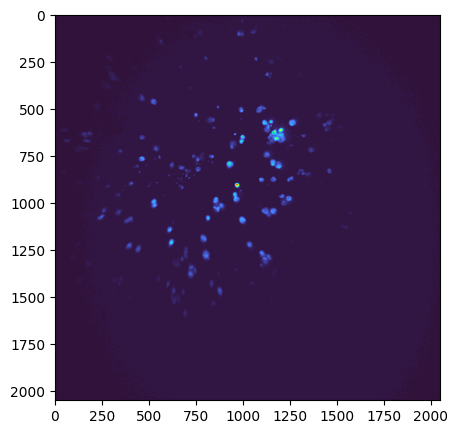

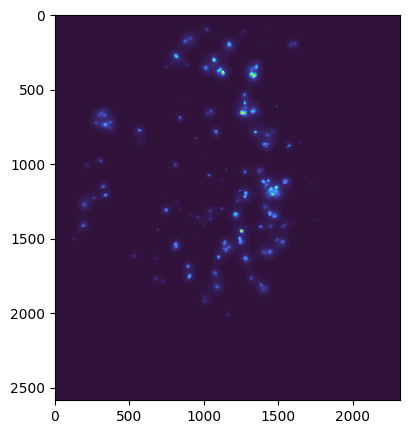

In [59]:

plt.figure(figsize=(5, 5), dpi=100)
plt.imshow(image_1, cmap='turbo')
plt.show()

plt.figure(figsize=(5, 5), dpi=100)
plt.imshow(result, cmap='turbo')
plt.show()

In [ ]:

for image in grouped_paths[0][::-1]:
    image = tiff.imread(os.path.join(image, 'max.tif'))
    plt.figure(dpi=300)
    plt.imshow(image)
    plt.show()



In [8]:
from stitching import AffineStitcher
settings = {# The whole plan should be considered
            "crop": False,
            # The matches confidences aren't that good
            "confidence_threshold": 0.5}  
stitcher = AffineStitcher(**settings)


NameError: name 'stitcher' is not defined

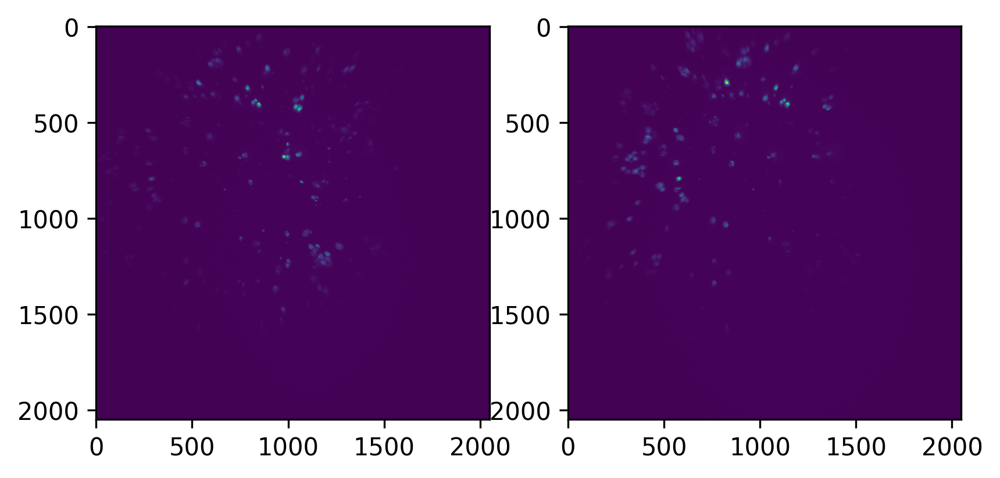

<Figure size 1920x1440 with 0 Axes>

In [11]:
arrays = []
ax, fig = plt.subplots(1, 2, dpi=300)
for i, path in enumerate(grouped_paths[0][::-1][0:2]):
    img = tiff.imread(os.path.join(path, 'max.tif'))
    fig[i].imshow(img)

    converted_image = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
    # save converted_image
    tiff.imwrite(os.path.join(path, 'converted_image.tif'), converted_image)
    arrays.append(os.path.join(path, 'converted_image.tif'))

plt.figure(dpi=300)
panorama = stitcher.stitch(arrays)
plt.imshow(panorama[:, :, 0], cmap='turbo')
plt.colorbar()


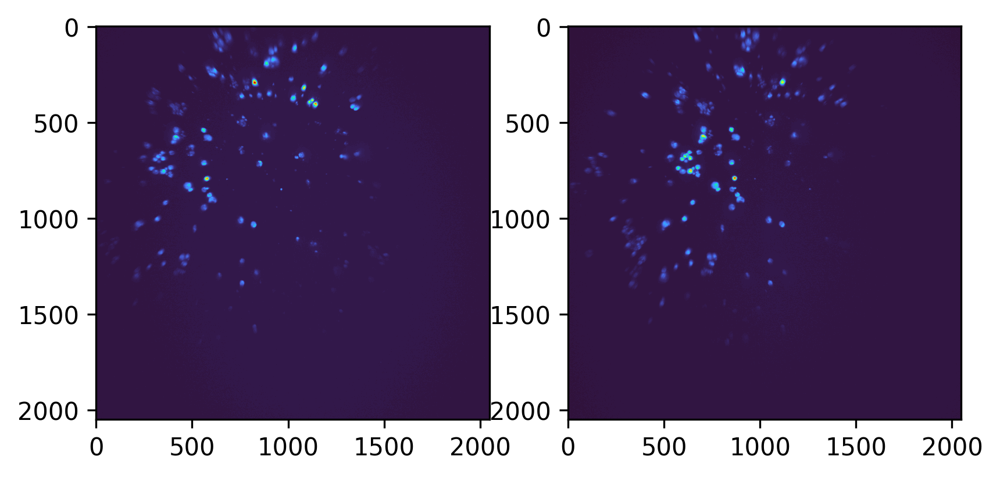

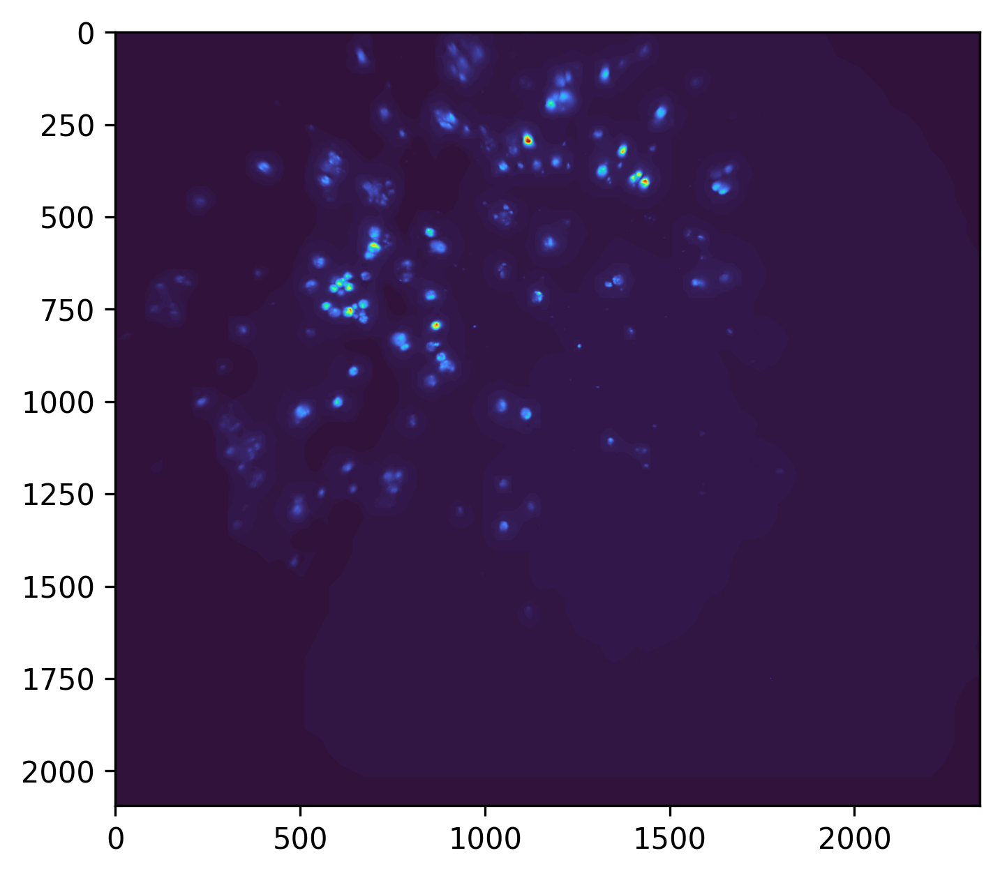

In [18]:

arrays = []
ax, fig = plt.subplots(1, 2, dpi=300)
for i, path in enumerate(grouped_paths[0][::-1][1:3]):
    img = tiff.imread(os.path.join(path, 'max.tif'))
    fig[i].imshow(img, cmap='turbo')

    converted_image = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
    # save converted_image
    tiff.imwrite(os.path.join(path, 'converted_image.tif'), converted_image)
    arrays.append(os.path.join(path, 'converted_image.tif'))

plt.figure(dpi=300)
panorama = stitcher.stitch(arrays)
plt.imshow(panorama[:, :, 0], cmap='turbo')

    

In [8]:
import os
for i, image in enumerate(images):
    channel_1 = image[:,:,0]
    #save channel_1 to folder called channel_1

    # channel_2 = image[:,:,1]
    # #save channel_2 to folder called channel_2
    os.makedirs(r'Y:\Projects\piescope\piescope_dev\tile\channel_1\\', exist_ok=True)
    tf.imsave(r'Y:\Projects\piescope\piescope_dev\tile\channel_1\\' + str(i) + '.tif', channel_1)

NameError: name 'images' is not defined

In [ ]:
im = tf.imread(r'Y:\Projects\piescope\piescope_dev\tile\channel_1\0.tif')

In [ ]:
image8bit = cv2.normalize(im, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
cv2.imwrite(r'Y:\Projects\piescope\piescope_dev\tile\channel_1\0_8bit.tif', image8bit)

True

In [ ]:
print(im.shape)
descriptor = cv2.SIFT_create()
# matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

keypoints, descriptors = descriptor.detectAndCompute(image8bit, None)

# def get_matches(descriptors1, descriptors2):
#     return matcher.match(descriptors1, descriptors2)



(2048, 2048)


In [ ]:
print(keypoints)

(<KeyPoint 0000021F93ABFF00>, <KeyPoint 0000021F93BAE8D0>, <KeyPoint 0000021F93C1FB10>, <KeyPoint 0000021F93C1FCF0>, <KeyPoint 0000021F93BC0FC0>, <KeyPoint 0000021F93BC0F60>, <KeyPoint 0000021F93BC0900>, <KeyPoint 0000021F93D243F0>, <KeyPoint 0000021F93D244B0>, <KeyPoint 0000021F93D24510>, <KeyPoint 0000021F93C147E0>, <KeyPoint 0000021F93C14B40>, <KeyPoint 0000021F93C14810>, <KeyPoint 0000021F93AA09C0>, <KeyPoint 0000021F93C05450>, <KeyPoint 0000021F93BDB060>, <KeyPoint 0000021F93BDB090>, <KeyPoint 0000021F93BDB120>, <KeyPoint 0000021F93BDBA20>, <KeyPoint 0000021F93BDBE70>, <KeyPoint 0000021F93BDB510>, <KeyPoint 0000021F93BDB1E0>, <KeyPoint 0000021F93BDB360>, <KeyPoint 0000021F93BDBD50>, <KeyPoint 0000021F93C2DC60>, <KeyPoint 0000021F93C2DF90>, <KeyPoint 0000021F93C2D300>, <KeyPoint 0000021F93C2DF00>, <KeyPoint 0000021F93C2DA50>, <KeyPoint 0000021F93C2D3F0>, <KeyPoint 0000021F939D7210>, <KeyPoint 0000021F93C0ED80>, <KeyPoint 0000021F93C0EB10>, <KeyPoint 0000021F93C0EDE0>, <KeyPoint 000

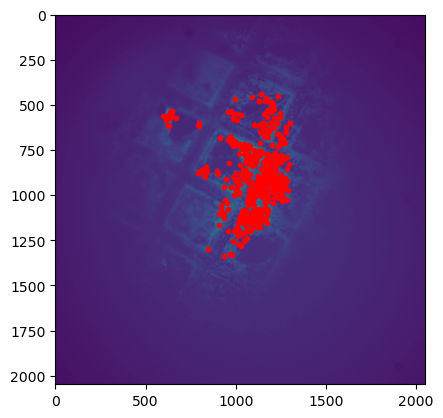

In [ ]:
plt.imshow(image8bit)
# plot keypoints
plt.scatter([p.pt[0] for p in keypoints], [p.pt[1] for p in keypoints], c='r', marker='.')
plt.show()


In [ ]:
im2 = tf.imread(r'Y:\Projects\piescope\piescope_dev\tile\channel_1\1.tif')


In [ ]:
image8bit2 = cv2.normalize(im2, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
cv2.imwrite(r'Y:\Projects\piescope\piescope_dev\tile\channel_1\1_8bit.tif', image8bit2)

True

In [ ]:
descriptor2 = cv2.SIFT_create()
# matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

keypoints2, descriptors2 = descriptor2.detectAndCompute(image8bit2, None)


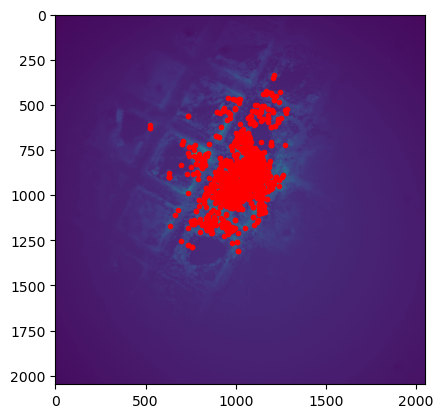

In [ ]:
plt.imshow(image8bit2)
# plot keypoints
plt.scatter([p.pt[0] for p in keypoints2], [p.pt[1] for p in keypoints2], c='r', marker='.')
plt.show()


In [ ]:
stitcher = cv2.Stitcher_create()
status, stitched = stitcher.stitch([r'Y:\Projects\piescope\piescope_dev\tile\channel_1\0_8bit.tif', r'Y:\Projects\piescope\piescope_dev\tile\channel_1\1_8bit.tif'], masks=None)


error: OpenCV(4.5.5) :-1: error: (-5:Bad argument) in function 'stitch'
> Overload resolution failed:
>  - 'masks' is an invalid keyword argument for Stitcher.stitch()
>  - 'masks' is an invalid keyword argument for Stitcher.stitch()
>  - Can't parse 'images'. Sequence item with index 0 has a wrong type
>  - Can't parse 'images'. Sequence item with index 0 has a wrong type


In [ ]:
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(descriptors,descriptors2)
matches = sorted(matches, key = lambda x:x.distance)

print(matches)

[<DMatch 0000021F9397FE50>, <DMatch 0000021F9397FBF0>, <DMatch 0000021F93C7D570>, <DMatch 0000021F93C47070>, <DMatch 0000021F9397F770>, <DMatch 0000021F93C7C650>, <DMatch 0000021F9397FC70>, <DMatch 0000021F93C7C630>, <DMatch 0000021F9397FB70>, <DMatch 0000021F9397FA10>, <DMatch 0000021F93C7DC30>, <DMatch 0000021F93C7D530>, <DMatch 0000021F9397F570>, <DMatch 0000021F93C7D670>, <DMatch 0000021F93C7C3F0>, <DMatch 0000021F9397FE30>, <DMatch 0000021F93C7C510>, <DMatch 0000021F93C7C570>, <DMatch 0000021F9397F370>, <DMatch 0000021F93C7C450>, <DMatch 0000021F9397F410>, <DMatch 0000021F93C7D630>, <DMatch 0000021F93C73950>, <DMatch 0000021F93C7C550>, <DMatch 0000021F93C738F0>, <DMatch 0000021F93C7D890>, <DMatch 0000021F93C733D0>, <DMatch 0000021F93C73C30>, <DMatch 0000021F9397FA90>, <DMatch 0000021F9397FB50>, <DMatch 0000021F93C7D8D0>, <DMatch 0000021F9397F350>, <DMatch 0000021F93CA3CF0>, <DMatch 0000021F93C73250>, <DMatch 0000021F93C73D90>, <DMatch 0000021F9397F5D0>, <DMatch 0000021F93C7C2B0>, 

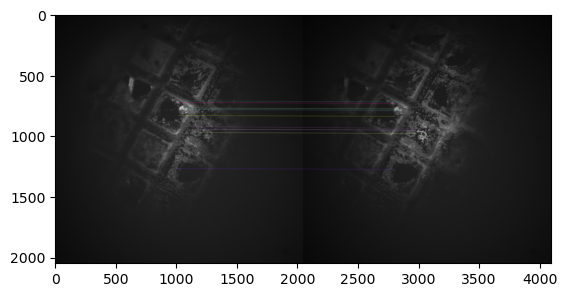

In [ ]:
img3 = cv2.drawMatches(image8bit,keypoints,image8bit2,keypoints2,matches[:10],None, flags=2)
plt.imshow(img3),
plt.show()



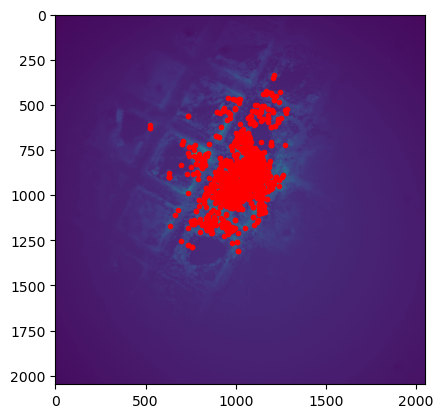

In [ ]:
# plot shifted image
plt.imshow(image8bit2)

In [ ]:
(H, status) = cv2.findHomography(pts1, pts2, cv.RANSAC)

In [ ]:
from stitch2d import create_mosaic, StructuredMosaic

In [ ]:
path = r"Y:\Projects\piescope\piescope_dev\tile"

In [ ]:
structured_mosaic = StructuredMosaic(path, dim=(3, 3))

In [ ]:
from stitching import AffineStitcher

In [ ]:
print(AffineStitcher.AFFINE_DEFAULTS)

{'estimator': 'affine', 'wave_correct_kind': 'no', 'matcher_type': 'affine', 'adjuster': 'affine', 'warper_type': 'affine', 'compensator': 'no'}


In [ ]:
settings = {# The whole plan should be considered
            "crop": False,
            # The matches confidences aren't that good
            "confidence_threshold": 0.5}  

In [ ]:
stitcher = AffineStitcher(**settings)

In [ ]:
panorama = stitcher.stitch([r'Y:\Projects\piescope\piescope_dev\tile\channel_1\0_8bit.tif',r'Y:\Projects\piescope\piescope_dev\tile\channel_1\1_8bit.tif'])

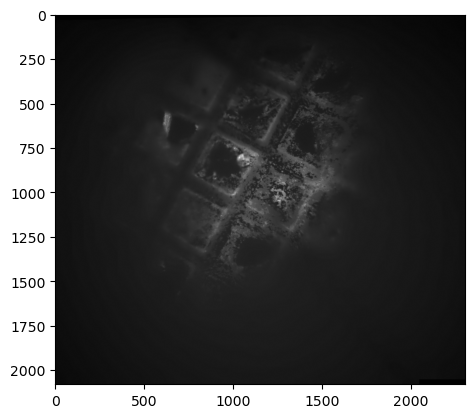

In [ ]:
plt.imshow(panorama)
plt.show()


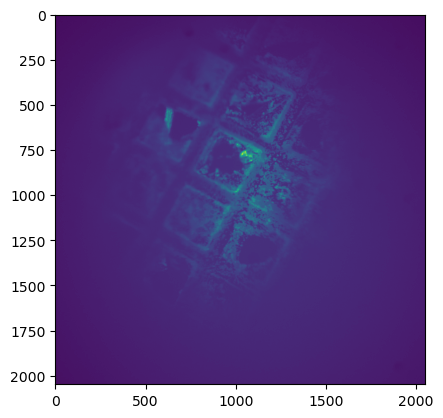

In [ ]:
plt.imshow(image8bit)
plt.show()

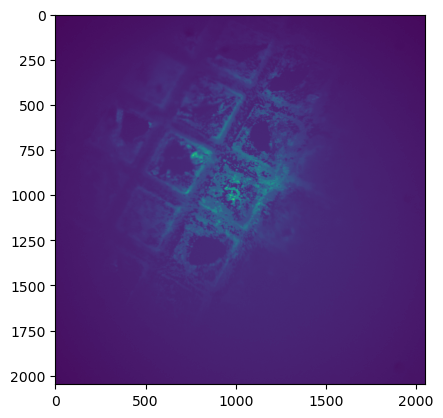

In [ ]:
plt.imshow(image8bit2)

In [ ]:
image_list = glob(r'Y:\Projects\piescope\piescope_dev\tile\channel_1\*.tif')

In [ ]:
for i in image_list:
    array = tf.imread(i)
    image8bit = cv2.normalize(array, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
    cv2.imwrite(i[:-4] + '_8bit.tif', image8bit)

In [ ]:
image_8bit_list = glob(r'Y:\Projects\piescope\piescope_dev\tile\channel_1\*_8bit.tif')


['Y:\\Projects\\piescope\\piescope_dev\\tile\\channel_1\\0_8bit.tif', 'Y:\\Projects\\piescope\\piescope_dev\\tile\\channel_1\\1_8bit.tif', 'Y:\\Projects\\piescope\\piescope_dev\\tile\\channel_1\\2_8bit.tif', 'Y:\\Projects\\piescope\\piescope_dev\\tile\\channel_1\\3_8bit.tif', 'Y:\\Projects\\piescope\\piescope_dev\\tile\\channel_1\\4_8bit.tif', 'Y:\\Projects\\piescope\\piescope_dev\\tile\\channel_1\\5_8bit.tif', 'Y:\\Projects\\piescope\\piescope_dev\\tile\\channel_1\\6_8bit.tif', 'Y:\\Projects\\piescope\\piescope_dev\\tile\\channel_1\\7_8bit.tif', 'Y:\\Projects\\piescope\\piescope_dev\\tile\\channel_1\\8_8bit.tif']


In [ ]:
panorama_8bit = stitcher.stitch(image_8bit_list)


In [ ]:
panorama_8bit.shape

(2616, 2615, 3)

C:\Users\Dadie1\AppData\Local\Temp\ipykernel_22684\3070978457.py:1: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(panorama_8bit[:, :, 0]), cmap='turbo')


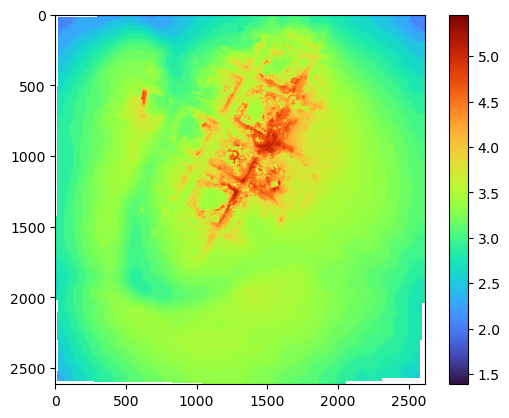

In [ ]:
plt.imshow(np.log(panorama_8bit[:, :, 0]), cmap='turbo')
plt.colorbar()
plt.show()

In [ ]:
nimages = []
for i in image_8bit_list:
    im = tf.imread(i)
    images.append(im)

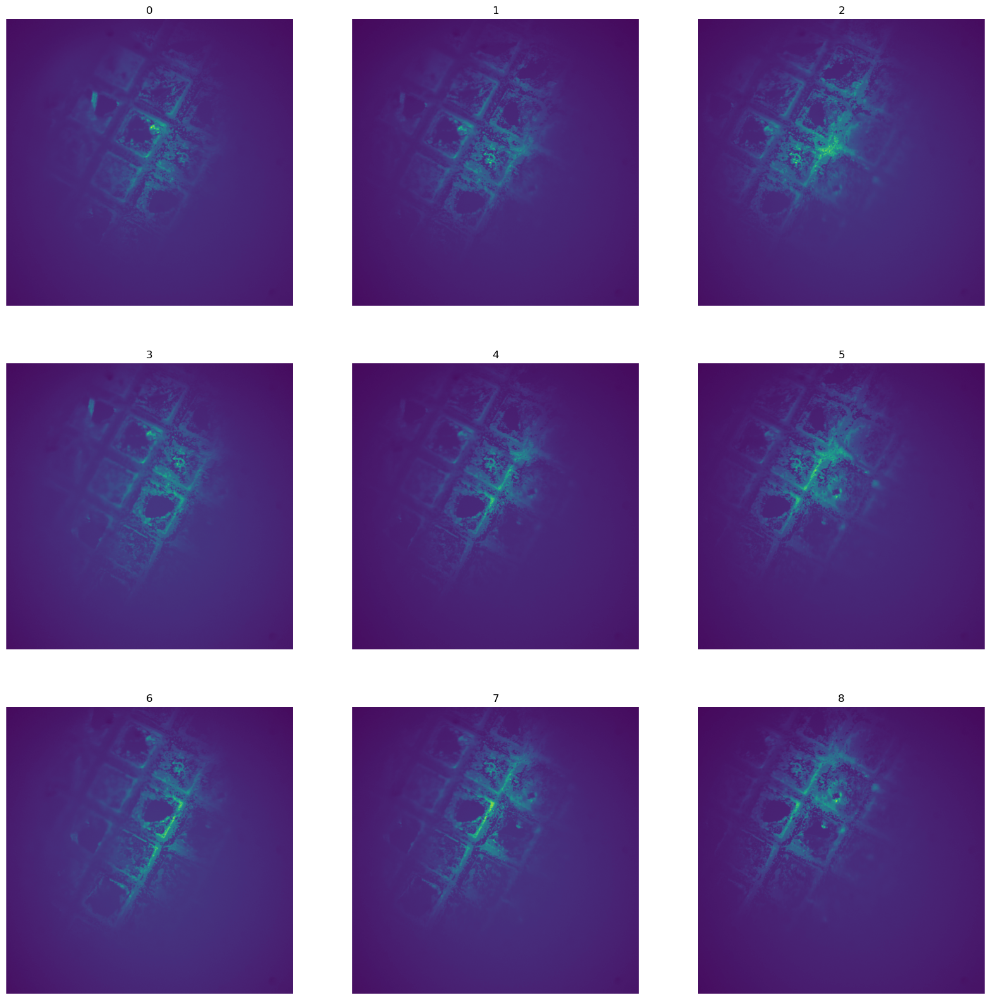

In [ ]:
fig, ax = plt.subplots(3, 3, figsize=(20, 20))

# plot 9 images on a 3x3 grid with only the index of the image
for i, image in enumerate(images):
    ax[i // 3, i % 3].imshow(image)
    ax[i // 3, i % 3].set_title(i)
    ax[i // 3, i % 3].axis('off')
    


In [ ]:
# split images into 3 smaller subset arrays
images1 = image_8bit_list[:3]
images2 = image_8bit_list[3:6]
images3 = image_8bit_list[6:9]


In [ ]:
panorama_8bit1 = stitcher.stitch(images1)
panorama_8bit2 = stitcher.stitch(images2)
panorama_8bit3 = stitcher.stitch(images3)


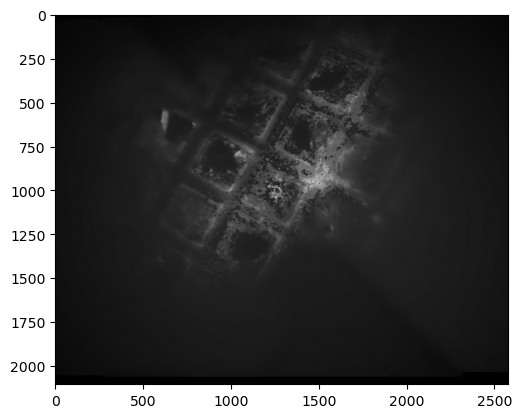

In [ ]:
plt.imshow(panorama_8bit1)

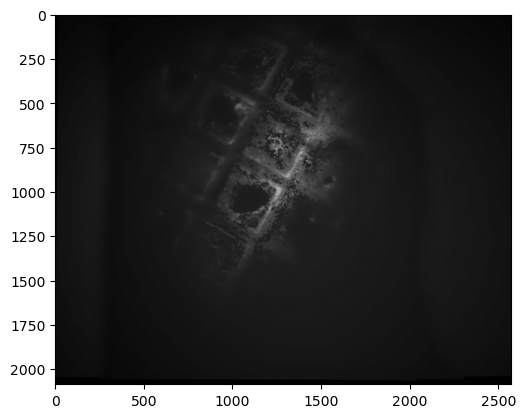

In [ ]:
plt.imshow(panorama_8bit2)

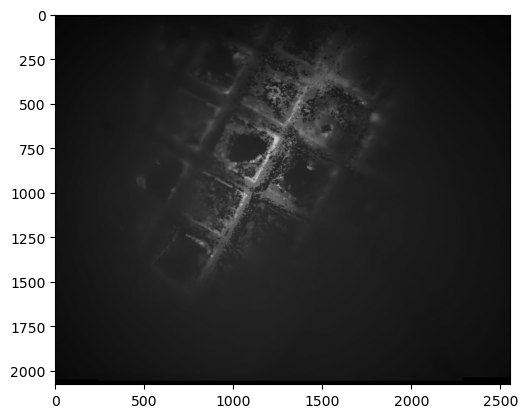

In [ ]:
plt.imshow(panorama_8bit3)

In [ ]:
# save the 3 panorama
cv2.imwrite(r'Y:\Projects\piescope\piescope_dev\tile\channel_1\panorama_8bit1.tif', panorama_8bit1)
cv2.imwrite(r'Y:\Projects\piescope\piescope_dev\tile\channel_1\panorama_8bit2.tif', panorama_8bit2)
cv2.imwrite(r'Y:\Projects\piescope\piescope_dev\tile\channel_1\panorama_8bit3.tif', panorama_8bit3)


True

In [ ]:
# rotate the panoramas by 90 degrees
panorama_8bit1_rot = np.rot90(panorama_8bit1)
panorama_8bit2_rot = np.rot90(panorama_8bit2)
panorama_8bit3_rot = np.rot90(panorama_8bit3)

# save the rotated panoramas
cv2.imwrite(r'Y:\Projects\piescope\piescope_dev\tile\channel_1\panorama_8bit1_rot.tif', panorama_8bit1_rot)
cv2.imwrite(r'Y:\Projects\piescope\piescope_dev\tile\channel_1\panorama_8bit2_rot.tif', panorama_8bit2_rot)
cv2.imwrite(r'Y:\Projects\piescope\piescope_dev\tile\channel_1\panorama_8bit3_rot.tif', panorama_8bit3_rot)


True

In [ ]:
panorama_rotated_left = stitcher.stitch([r'Y:\Projects\piescope\piescope_dev\tile\channel_1\panorama_8bit3_rot.tif', r'Y:\Projects\piescope\piescope_dev\tile\channel_1\panorama_8bit2_rot.tif'])
panorama_rotated_right = stitcher.stitch([r'Y:\Projects\piescope\piescope_dev\tile\channel_1\panorama_8bit2_rot.tif', r'Y:\Projects\piescope\piescope_dev\tile\channel_1\panorama_8bit1_rot.tif'])

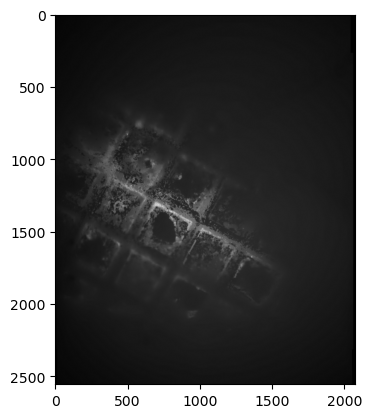

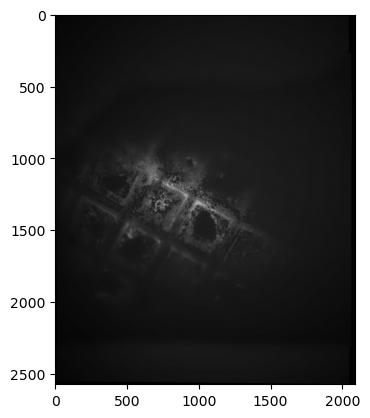

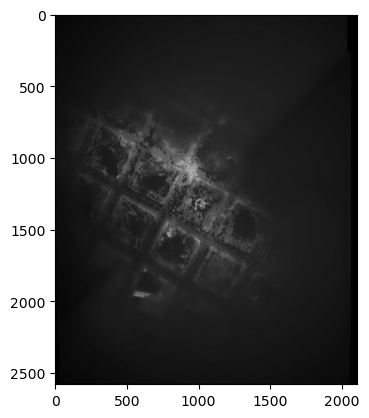

In [ ]:
plt.imshow(panorama_8bit3_rot)
plt.show()

plt.imshow(panorama_8bit2_rot)
plt.show()

plt.imshow(panorama_8bit1_rot)
plt.show()

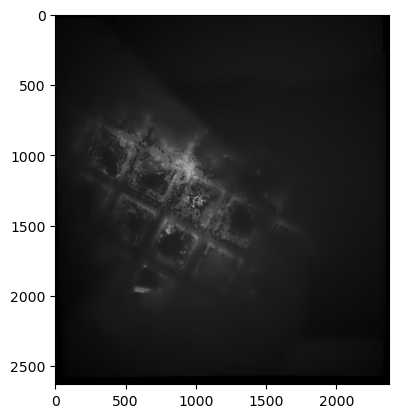

In [ ]:
plt.imshow(panorama_rotated_right)
plt.show()

In [ ]:
cv2.imwrite(r'Y:\Projects\piescope\piescope_dev\tile\channel_1\panorama_rotated_right.tif', panorama_rotated_right)

True

In [ ]:
panorama_final = stitcher.stitch([r'Y:\Projects\piescope\piescope_dev\tile\channel_1\panorama_8bit3_rot.tif', r'Y:\Projects\piescope\piescope_dev\tile\channel_1\panorama_rotated_right.tif'])

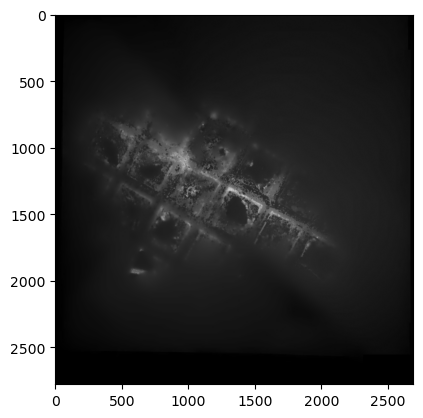

In [ ]:
plt.imshow(panorama_final)

In [ ]:
# rotate the final panorama by -90 degrees
panorama_final_rot = np.rot90(panorama_final, k=-1)



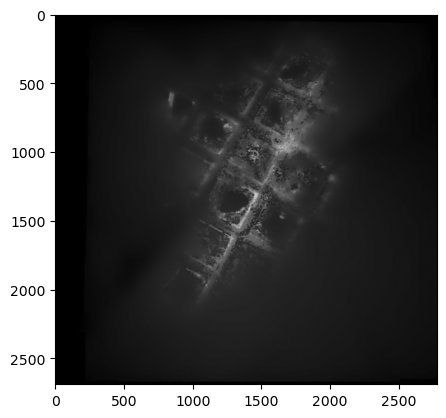

: 

In [ ]:
plt.imshow(panorama_final_rot)